# Solution Assignment 3 - Andrés Eduardo Ramírez Vela

### Using Pandas and Statsmodels write a Jupyter Notebook that:

    1. Uses the data from the Maddison Project to plot the evolution of total population across the world.
    2. Plots the evolution of the share of the world population by countries and WB regions.
    3. Downloads fertility, mortality and life expectancy data from the WB and plots its evolution in the last 60 years.
    4. Downloads mortality and life expectancy data (across regions and cohorts) from the Human    Mortality Database and plots its evolution.
    5. Using this data analyze the convergence of life expectanty, mortality and fertility.
Submit your notebook as a pull request to the course's github repository.


### Solution 1

In [1]:
from __future__ import division
import pandas as pd
import pandas_datareader as web
import numpy as np
%pylab --no-import-all
%matplotlib inline
import matplotlib as mpl
import seaborn as sns
sns.set()

/Users/anramive/opt/anaconda3/envs/GeoPython38env/lib/python3.8/site-packages/pandas_datareader/compat/__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


Using matplotlib backend: MacOSX
Populating the interactive namespace from numpy and matplotlib


In [15]:
import os
import urllib
pathout = './data/'

if not os.path.exists(pathout):
    os.mkdir(pathout)
    
pathgraphs = './graphs/'
if not os.path.exists(pathgraphs):
    os.mkdir(pathgraphs)

In [16]:
try:
    maddison_new = pd.read_stata(pathout + 'Maddison2018.dta')
    maddison_new_region = pd.read_stata(pathout + 'Maddison2018_region.dta')
    maddison_new_1990 = pd.read_stata(pathout + 'Maddison2018_1990.dta')
except:
    maddison_new = pd.read_stata('https://www.rug.nl/ggdc/historicaldevelopment/maddison/data/mpd2018.dta')
    maddison_new.to_stata(pathout + 'Maddison2018.dta', write_index=False, version=117)
    maddison_new_region = pd.read_stata('https://www.rug.nl/ggdc/historicaldevelopment/maddison/data/mpd2018_region_data.dta')
    maddison_new_region.to_stata(pathout + 'Maddison2018_region.dta', write_index=False, version=117)
    maddison_new_1990 = pd.read_stata('https://www.rug.nl/ggdc/historicaldevelopment/maddison/data/mpd2018_1990bm.dta')
    maddison_new_1990.to_stata(pathout + 'Maddison2018_1990.dta', write_index=False, version=117)

In [17]:
if not os.path.exists(pathout + 'Maddison_original.xls'):
    import urllib
    dataurl = "http://www.ggdc.net/maddison/Historical_Statistics/horizontal-file_02-2010.xls"
    urllib.request.urlretrieve(dataurl, pathout + 'Maddison_original.xls')

In [19]:
maddison_old_pop = pd.read_excel(pathout + 'Maddison_original.xls', sheet_name="Population", skiprows=2)
maddison_old_pop

,Unnamed: 0,1,Unnamed: 2,1000,Unnamed: 4,1500,Unnamed: 6,1600,Unnamed: 8,1700,...,2002,2003,2004,2005,2006,2007,2008,2009,Unnamed: 201,2030
0,Western Europe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Austria,500.0,NaN,700.0,NaN,2000.0,NaN,2500.0,NaN,2500.0,...,8148.312,8162.656,8174.762,8184.691,8192.880,8199.783,8205.533,8210,NaN,8120.000
2,Belgium,300.0,NaN,400.0,NaN,1400.0,NaN,1600.0,NaN,2000.0,...,10311.970,10330.824,10348.276,10364.388,10379.067,10392.226,10403.951,10414,NaN,10409.000
3,Denmark,180.0,NaN,360.0,NaN,600.0,NaN,650.0,NaN,700.0,...,5374.693,5394.138,5413.392,5432.335,5450.661,5468.120,5484.723,5501,NaN,5730.488
4,Finland,20.0,NaN,40.0,NaN,300.0,NaN,400.0,NaN,400.0,...,5193.039,5204.405,5214.512,5223.442,5231.372,5238.460,5244.749,5250,NaN,5201.445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,Guadeloupe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,435.739,440.189,444.515,448.713,452.776,456.698,460.486,n.a.,NaN,523.493
274,Guyana (Fr.),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,182.333,186.917,191.309,195.506,199.509,203.321,206.941,n.a.,NaN,272.781
275,Martinique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,422.277,425.966,429.510,432.900,436.131,439.202,442.119,n.a.,NaN,486.714
276,Reunion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,743.981,755.171,766.153,776.948,787.584,798.094,808.506,n.a.,NaN,1025.217


In [20]:
maddison_old_pop.rename(columns={'Unnamed: 0':'Country'}, inplace=True)
maddison_old_pop = maddison_old_pop[[col for col in maddison_old_pop.columns if str(col).startswith('Unnamed')==False]]
maddison_old_pop.columns = ['Country'] + ['population_'+str(col) for col in maddison_old_pop.columns[1:]]
maddison_old_pop


,Country,population_1,population_1000,population_1500,population_1600,population_1700,population_1820,population_1821,population_1822,population_1823,...,population_2001,population_2002,population_2003,population_2004,population_2005,population_2006,population_2007,population_2008,population_2009,population_2030
0,Western Europe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Austria,500.0,700.0,2000.0,2500.0,2500.0,3369.0,3386.0,3402.0,3419.0,...,8131.690,8148.312,8162.656,8174.762,8184.691,8192.880,8199.783,8205.533,8210,8120.000
2,Belgium,300.0,400.0,1400.0,1600.0,2000.0,3434.0,3464.0,3495.0,3526.0,...,10291.679,10311.970,10330.824,10348.276,10364.388,10379.067,10392.226,10403.951,10414,10409.000
3,Denmark,180.0,360.0,600.0,650.0,700.0,1155.0,1167.0,1179.0,1196.0,...,5355.826,5374.693,5394.138,5413.392,5432.335,5450.661,5468.120,5484.723,5501,5730.488
4,Finland,20.0,40.0,300.0,400.0,400.0,1169.0,1186.0,1202.0,1219.0,...,5180.309,5193.039,5204.405,5214.512,5223.442,5231.372,5238.460,5244.749,5250,5201.445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,Guadeloupe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,431.170,435.739,440.189,444.515,448.713,452.776,456.698,460.486,n.a.,523.493
274,Guyana (Fr.),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,177.562,182.333,186.917,191.309,195.506,199.509,203.321,206.941,n.a.,272.781
275,Martinique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,418.454,422.277,425.966,429.510,432.900,436.131,439.202,442.119,n.a.,486.714
276,Reunion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,732.570,743.981,755.171,766.153,776.948,787.584,798.094,808.506,n.a.,1025.217


In [21]:
population = maddison_old_pop.loc[maddison_old_pop.Country.apply(lambda x: str(x).upper().find('TOTAL')!=-1)].reset_index(drop=True)
population = population.dropna(subset=['population_1'])
population = population.loc[2:]
population['Country'] = population.Country.str.replace('Total', '').str.replace('Countries', '').str.replace('\d+', '').str.replace('European', 'Europe').str.strip()
population = population.loc[population.Country.apply(lambda x: x.find('USSR')==-1 and  x.find('West Asian')==-1)].reset_index(drop=True)
population = population.dropna(axis=1, how='any')
population

,Country,population_1,population_1000,population_1500,population_1600,population_1700,population_1820,population_1870,population_1900,population_1913,...,population_2001,population_2002,population_2003,population_2004,population_2005,population_2006,population_2007,population_2008,population_2009,population_2030
0,Western Europe,25050.0,25560.0,57268.0,73778.0,81460.0,1.330280e+05,1.874990e+05,233645.000,2.609750e+05,...,3.943612e+05,3.955093e+05,3.965978e+05,3.976500e+05,398656.277,3.996072e+05,4.005125e+05,4.013529e+05,402418,405751.702
1,Western Offshoots,1120.0,1870.0,2800.0,2300.0,1750.0,1.123051e+04,4.608763e+04,86396.000,1.114010e+05,...,3.394240e+05,3.423850e+05,3.456020e+05,3.489440e+05,352249.000,3.556780e+05,3.585480e+05,3.626210e+05,366175,443038.000
2,East Europe,4750.0,6500.0,13500.0,16950.0,18800.0,3.645700e+04,5.355700e+04,70993.000,7.953000e+04,...,1.206569e+05,1.206393e+05,1.206074e+05,1.205819e+05,120531.758,1.204637e+05,1.203780e+05,1.202745e+05,120154,113554.887
3,Latin America,5600.0,11400.0,17500.0,8600.0,12050.0,2.159145e+04,4.040057e+04,64605.986,8.083064e+04,...,5.281915e+05,5.355156e+05,5.429169e+05,5.494170e+05,557941.371,5.654160e+05,5.728300e+05,5.802172e+05,583991,724464.840
4,Asia,168400.0,182600.0,283800.0,378500.0,401800.0,7.104000e+05,7.690499e+05,873324.000,9.792991e+05,...,3.653696e+06,3.700181e+06,3.746026e+06,3.781524e+06,3837845.758,3.882964e+06,3.927514e+06,3.972154e+06,4017611,4916929.556
5,Africa,17000.0,32300.0,46610.0,55320.0,61080.0,7.423600e+04,9.046600e+04,110000.000,1.246970e+05,...,8.304815e+05,8.502847e+05,8.702049e+05,8.902262e+05,910631.214,9.314865e+05,9.527871e+05,9.745277e+05,990447,1517429.536
6,World,225820.0,267330.0,438428.0,556148.0,603490.0,1.041708e+06,1.275732e+06,1563463.986,1.792925e+06,...,6.154791e+06,6.231704e+06,6.308364e+06,6.374056e+06,6462986.555,6.540214e+06,6.616689e+06,6.694832e+06,6764086,8392749.907


In [22]:
population = pd.wide_to_long(population, ['population_'], i='Country', j='year').reset_index()
population

,Country,year,population_
0,Western Europe,1,25050
1,Western Offshoots,1,1120
2,East Europe,1,4750
3,Latin America,1,5600
4,Asia,1,168400
...,...,...,...
499,East Europe,2030,113555
500,Latin America,2030,724465
501,Asia,2030,4.91693e+06
502,Africa,2030,1.51743e+06


In [23]:
pop = population.pivot_table(index='year',columns='Country',values='population_',aggfunc='sum')
pop

Country,Africa,Asia,East Europe,Latin America,Western Europe,Western Offshoots,World
year,,,,,,,
1,17000.000,1.684000e+05,4750.000,5600.000,25050.000,1120.0,2.258200e+05
1000,32300.000,1.826000e+05,6500.000,11400.000,25560.000,1870.0,2.673300e+05
1500,46610.000,2.838000e+05,13500.000,17500.000,57268.000,2800.0,4.384280e+05
1600,55320.000,3.785000e+05,16950.000,8600.000,73778.000,2300.0,5.561480e+05
1700,61080.000,4.018000e+05,18800.000,12050.000,81460.000,1750.0,6.034900e+05
...,...,...,...,...,...,...,...
2006,931486.521,3.882964e+06,120463.680,565415.973,399607.161,355678.0,6.540214e+06
2007,952787.083,3.927514e+06,120378.032,572829.964,400512.458,358548.0,6.616689e+06
2008,974527.690,3.972154e+06,120274.466,580217.248,401352.880,362621.0,6.694832e+06


Text(0, 0.5, 'Population')

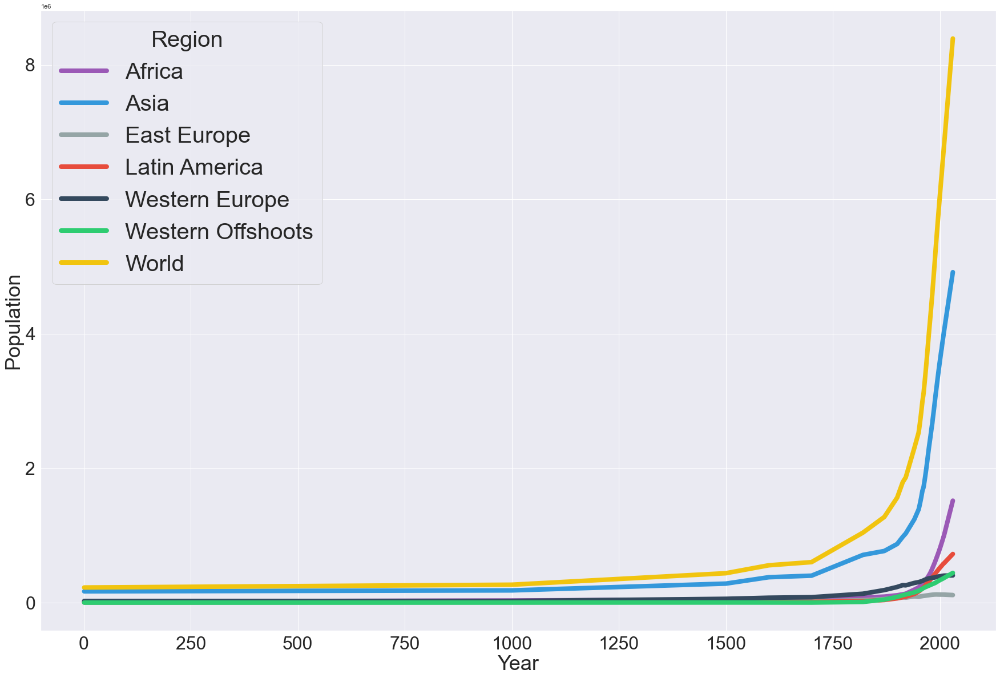

In [24]:
mycolors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71", "#f1c40f"]
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())

# Set the size of the figure and get a figure and axis object
fig, ax = plt.subplots(figsize=(30,20))
# Plot using the axis ax and colormap my_cmap
pop.loc[1:].plot(ax=ax, linewidth=8, cmap=my_cmap)
# Change options of axes, legend
ax.tick_params(axis = 'both', which = 'major', labelsize=32)
ax.tick_params(axis = 'both', which = 'minor', labelsize=16)
#ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:, .0f}'))
ax.legend(prop={'size': 40}).set_title("Region", prop = {'size':40})
# Label axes
ax.set_xlabel('Year', fontsize=36)
ax.set_ylabel('Population', fontsize=36)

### Solution 2

In [113]:
if not os.path.exists(pathout + 'Datapopularionwb.xls'):
    import urllib
    dataurl = "http://api.worldbank.org/v2/en/indicator/SP.POP.TOTL?downloadformat=excel"
    urllib.request.urlretrieve(dataurl, pathout + 'Datapopularionwb.xls')

In [114]:
wb_old_pop = pd.read_excel(pathout + 'Datapopularionwb.xls', sheet_name="Data", skiprows=2)


In [115]:
wb_pop.columns = ['Country Name'] + ['pop_'+str(col) for col in wb_pop.columns[1:]]

wb_pop

,Country Name,pop_Region,pop_Country Code,pop_Indicator Name,pop_Indicator Code,pop_1960,pop_1961,pop_1962,pop_1963,pop_1964,...,pop_2010,pop_2011,pop_2012,pop_2013,pop_2014,pop_2015,pop_2016,pop_2017,pop_2018,pop_2019
0,Aruba,Latin America & Caribbean,ABW,"Population, total",SP.POP.TOTL,54211.0,55438.0,56225.0,56695.0,57032.0,...,101669.0,102046.0,102560.0,103159.0,103774.0,104341.0,104872.0,105366.0,105845.0,NaN
1,Afghanistan,South Asia,AFG,"Population, total",SP.POP.TOTL,8996973.0,9169410.0,9351441.0,9543205.0,9744781.0,...,29185507.0,30117413.0,31161376.0,32269589.0,33370794.0,34413603.0,35383128.0,36296400.0,37172386.0,NaN
2,Angola,Sub-Saharan Africa,AGO,"Population, total",SP.POP.TOTL,5454933.0,5531472.0,5608539.0,5679458.0,5735044.0,...,23356246.0,24220661.0,25107931.0,26015780.0,26941779.0,27884381.0,28842484.0,29816748.0,30809762.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,South Africa,Sub-Saharan Africa,ZAF,"Population, total",SP.POP.TOTL,17099840.0,17524533.0,17965725.0,18423161.0,18896307.0,...,51216964.0,52004172.0,52834005.0,53689236.0,54545991.0,55386367.0,56203654.0,57000451.0,57779622.0,NaN
262,Zambia,Sub-Saharan Africa,ZMB,"Population, total",SP.POP.TOTL,3070776.0,3164329.0,3260650.0,3360104.0,3463213.0,...,13605984.0,14023193.0,14465121.0,14926504.0,15399753.0,15879361.0,16363507.0,16853688.0,17351822.0,NaN
263,Zimbabwe,NaN,ZWE,"Population, total",SP.POP.TOTL,3776681.0,3905034.0,4039201.0,4178726.0,4322861.0,...,12697723.0,12894316.0,13115131.0,13350356.0,13586681.0,13814629.0,14030390.0,14236745.0,14439018.0,NaN


In [116]:
wb_pop = pd.wide_to_long(wb_pop, ['pop_'], i='Country Name', j='year').reset_index() # wide ---> long
wb_pop

,Country Name,year,pop_Indicator Name,pop_Indicator Code,pop_Region,pop_Country Code,pop_
0,Aruba,1960,"Population, total",SP.POP.TOTL,Latin America & Caribbean,ABW,54211.0
1,Afghanistan,1960,"Population, total",SP.POP.TOTL,South Asia,AFG,8996973.0
2,Angola,1960,"Population, total",SP.POP.TOTL,Sub-Saharan Africa,AGO,5454933.0
...,...,...,...,...,...,...,...
15837,South Africa,2019,"Population, total",SP.POP.TOTL,Sub-Saharan Africa,ZAF,NaN
15838,Zambia,2019,"Population, total",SP.POP.TOTL,Sub-Saharan Africa,ZMB,NaN
15839,Zimbabwe,2019,"Population, total",SP.POP.TOTL,NaN,ZWE,NaN


In [117]:
wb_pop2 = wb_pop.pivot_table(index='year',columns='Country Name',values='pop_',aggfunc='sum') #otra forma de reshape
wb_pop2

Country Name,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Arab World,Argentina,Armenia,...,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,World,"Yemen, Rep.",Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1960,8996973.0,1608800.0,11057863.0,20123.0,13411.0,5454933.0,54131.0,92197753.0,20481779.0,1874121.0,...,8526300.0,63689.0,8141841.0,32670039.0,32500.0,0.0,3.031520e+09,5315355.0,3070776.0,3776681.0
1961,9169410.0,1659800.0,11336339.0,20602.0,14375.0,5531472.0,55001.0,94724510.0,20817266.0,1941492.0,...,8813616.0,65705.0,8439261.0,33666110.0,34300.0,0.0,3.072565e+09,5393036.0,3164329.0,3905034.0
1962,9351441.0,1711319.0,11619828.0,21253.0,15370.0,5608539.0,55841.0,97334442.0,21153052.0,2009526.0,...,9113620.0,67794.0,8742777.0,34683407.0,35000.0,0.0,3.125542e+09,5473671.0,3260650.0,4039201.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,36296400.0,2873457.0,41389198.0,55620.0,77001.0,29816748.0,95426.0,411898965.0,44044811.0,2944809.0,...,32388600.0,285510.0,29390409.0,94596642.0,107268.0,4454805.0,7.509934e+09,27834821.0,16853688.0,14236745.0
2018,37172386.0,2866376.0,42228429.0,55465.0,77006.0,30809762.0,96286.0,419790588.0,44494502.0,2951776.0,...,32955400.0,292680.0,28870195.0,95540395.0,106977.0,4569087.0,7.592887e+09,28498687.0,17351822.0,14439018.0
2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0


In [118]:
wb_pop2.rename(columns={'Caribbean small states':"Caribbean_small_states"}, inplace=True)
wb_pop2.rename(columns={'Central Europe and the Baltics':"Central_Europe_and_the_Baltics"}, inplace=True)
wb_pop2.rename(columns={'East Asia & Pacific':"East_Asia_y_Pacific"}, inplace=True)
wb_pop2.rename(columns={'Europe & Central Asia':"Europe_y_Central_Asia"}, inplace=True)
wb_pop2.rename(columns={'European Union':"European_Union"}, inplace=True)
wb_pop2.rename(columns={'Latin America & Caribbean':"Latin_America_y_Caribbean"}, inplace=True)
wb_pop2.rename(columns={'Middle East & North Africa':"Middle_East_y_North_Africa"}, inplace=True)
wb_pop2.rename(columns={'North America':"North_America"}, inplace=True)
wb_pop2.rename(columns={'South Asia':"South_Asia"}, inplace=True)
wb_pop2.rename(columns={'Sub-Saharan Africa':"Sub_Saharan_Africa"}, inplace=True)
wb_pop2

Country Name,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Arab World,Argentina,Armenia,...,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,World,"Yemen, Rep.",Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1960,8996973.0,1608800.0,11057863.0,20123.0,13411.0,5454933.0,54131.0,92197753.0,20481779.0,1874121.0,...,8526300.0,63689.0,8141841.0,32670039.0,32500.0,0.0,3.031520e+09,5315355.0,3070776.0,3776681.0
1961,9169410.0,1659800.0,11336339.0,20602.0,14375.0,5531472.0,55001.0,94724510.0,20817266.0,1941492.0,...,8813616.0,65705.0,8439261.0,33666110.0,34300.0,0.0,3.072565e+09,5393036.0,3164329.0,3905034.0
1962,9351441.0,1711319.0,11619828.0,21253.0,15370.0,5608539.0,55841.0,97334442.0,21153052.0,2009526.0,...,9113620.0,67794.0,8742777.0,34683407.0,35000.0,0.0,3.125542e+09,5473671.0,3260650.0,4039201.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,36296400.0,2873457.0,41389198.0,55620.0,77001.0,29816748.0,95426.0,411898965.0,44044811.0,2944809.0,...,32388600.0,285510.0,29390409.0,94596642.0,107268.0,4454805.0,7.509934e+09,27834821.0,16853688.0,14236745.0
2018,37172386.0,2866376.0,42228429.0,55465.0,77006.0,30809762.0,96286.0,419790588.0,44494502.0,2951776.0,...,32955400.0,292680.0,28870195.0,95540395.0,106977.0,4569087.0,7.592887e+09,28498687.0,17351822.0,14439018.0
2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0


In [119]:
wb_pop2['Caribbean small states'] = wb_pop2.Caribbean_small_states / wb_pop2.World
del wb_pop2['Caribbean_small_states']

wb_pop2['Central Europe and the_Baltics'] = wb_pop2.Central_Europe_and_the_Baltics / wb_pop2.World
del wb_pop2['Central_Europe_and_the_Baltics']

wb_pop2['East Asia & Pacific'] = wb_pop2.East_Asia_y_Pacific / wb_pop2.World
del wb_pop2['East_Asia_y_Pacific']

wb_pop2['Europe & Central Asia'] = wb_pop2.Europe_y_Central_Asia / wb_pop2.World
del wb_pop2['Europe_y_Central_Asia']

wb_pop2['European Union'] = wb_pop2.European_Union / wb_pop2.World
del wb_pop2['European_Union']

wb_pop2['Latin America & Caribbean'] = wb_pop2.Latin_America_y_Caribbean / wb_pop2.World
del wb_pop2['Latin_America_y_Caribbean']

wb_pop2['Middle East & North Africa'] = wb_pop2.Middle_East_y_North_Africa / wb_pop2.World
del wb_pop2['Middle_East_y_North_Africa']

wb_pop2['North America'] = wb_pop2.North_America / wb_pop2.World
del wb_pop2['North_America']

wb_pop2['South Asia'] = wb_pop2.South_Asia / wb_pop2.World
del wb_pop2['South_Asia']

wb_pop2['Sub-Saharan Africa'] = wb_pop2.Sub_Saharan_Africa / wb_pop2.World
del wb_pop2['Sub_Saharan_Africa']

wb_pop2

Country Name,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Arab World,Argentina,Armenia,...,Caribbean small states,Central Europe and the_Baltics,East Asia & Pacific,Europe & Central Asia,European Union,Latin America & Caribbean,Middle East & North Africa,North America,South Asia,Sub-Saharan Africa
year,,,,,,,,,,,,,,,,,,,,,
1960,8996973.0,1608800.0,11057863.0,20123.0,13411.0,5454933.0,54131.0,92197753.0,20481779.0,1874121.0,...,0.001384,0.030150,0.343378,0.219940,0.117732,0.072540,0.034703,0.065520,0.188961,0.074957
1961,9169410.0,1659800.0,11336339.0,20602.0,14375.0,5531472.0,55001.0,94724510.0,20817266.0,1941492.0,...,0.001391,0.030018,0.339958,0.219507,0.117165,0.073552,0.035170,0.065746,0.190375,0.075691
1962,9351441.0,1711319.0,11619828.0,21253.0,15370.0,5608539.0,55841.0,97334442.0,21153052.0,2009526.0,...,0.001393,0.029758,0.338827,0.218329,0.116204,0.074312,0.035528,0.065652,0.191165,0.076186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,36296400.0,2873457.0,41389198.0,55620.0,77001.0,29816748.0,95426.0,411898965.0,44044811.0,2944809.0,...,0.000974,0.013680,0.308138,0.121789,0.059406,0.084604,0.058756,0.048149,0.238729,0.139835
2018,37172386.0,2866376.0,42228429.0,55465.0,77006.0,30809762.0,96286.0,419790588.0,44494502.0,2951776.0,...,0.000969,0.013504,0.306621,0.120899,0.058843,0.084468,0.059123,0.047914,0.238959,0.142015
2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [120]:
del wb_pop2['World']

Text(0, 0.5, 'Population')

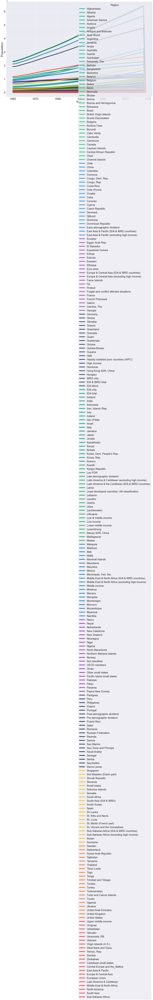

In [122]:
mycolors = ['#1abc9c', '#2ecc71', '#3498db', '#9b59b6', '#34495e', '#16a085', '#27ae60', '#2980b9', '#8e44ad', '#2c3e50', '#f1c40f', '#e67e22', '#e74c3c'] 
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())
# Set the size of the figure and get a figure and axis object
fig, ax = plt.subplots(figsize=(30,20))
# Plot using the axis ax and colormap my_cmap
wb_pop2.loc[1960:].plot(ax=ax, linewidth=8, cmap=my_cmap)
# Change options of axes, legend
ax.tick_params(axis = 'both', which = 'major', labelsize=32)
ax.tick_params(axis = 'both', which = 'minor', labelsize=16)
#ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:, .0f}'))
ax.legend(prop={'size': 30}).set_title("Region", prop = {'size':30})
# Label axes
ax.set_xlabel('Year', fontsize=36)
ax.set_ylabel('Population', fontsize=36)

### Solution 3

In [123]:
if not os.path.exists(pathout + 'WB_fert.xls'):
    dataurl2 = "http://api.worldbank.org/v2/en/indicator/SP.DYN.TFRT.IN?downloadformat=excel"
    urllib.request.urlretrieve(dataurl2, pathout + 'WB_fert.xls')

if not os.path.exists(pathout + 'WB_mort.xls'):
    dataurl2 = "http://api.worldbank.org/v2/en/indicator/SP.DYN.CDRT.IN?downloadformat=excel"
    urllib.request.urlretrieve(dataurl2, pathout + 'WB_mort.xls')
    
if not os.path.exists(pathout + 'WB_le.xls'):
    dataurl2 = "http://api.worldbank.org/v2/en/indicator/SP.DYN.LE00.IN?downloadformat=excel"
    urllib.request.urlretrieve(dataurl2, pathout + 'WB_le.xls')

In [124]:
wb_fert = pd.read_excel(pathout + 'WB_fert.xls', sheet_name="Data", skiprows=3)
wb_fert

,Country Name,Region,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,Latin America & Caribbean,ABW,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,4.820,4.655,4.471,4.271,4.059,...,1.768,1.779,1.795,1.813,1.834,1.854,1.872,1.886,1.896,NaN
1,Afghanistan,South Asia,AFG,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.450,7.450,7.450,7.450,7.450,...,5.977,5.770,5.562,5.359,5.163,4.976,4.800,4.633,4.473,NaN
2,Angola,Sub-Saharan Africa,AGO,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.708,6.790,6.872,6.954,7.036,...,6.194,6.120,6.039,5.953,5.864,5.774,5.686,5.600,5.519,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,South Africa,Sub-Saharan Africa,ZAF,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.041,6.028,6.010,5.986,5.956,...,2.598,2.582,2.561,2.537,2.511,2.484,2.457,2.430,2.405,NaN
262,Zambia,Sub-Saharan Africa,ZMB,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.115,7.169,7.214,7.249,7.274,...,5.415,5.328,5.233,5.132,5.026,4.918,4.814,4.718,4.633,NaN
263,Zimbabwe,NaN,ZWE,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.158,7.215,7.267,7.311,7.347,...,4.034,4.059,4.058,4.030,3.974,3.896,3.804,3.707,3.615,NaN


In [125]:
wb_fert.columns = ['Country Name'] + ['fert_'+str(col) for col in wb_fert.columns[1:]]
wb_fert

,Country Name,fert_Region,fert_Country Code,fert_Indicator Name,fert_Indicator Code,fert_1960,fert_1961,fert_1962,fert_1963,fert_1964,...,fert_2010,fert_2011,fert_2012,fert_2013,fert_2014,fert_2015,fert_2016,fert_2017,fert_2018,fert_2019
0,Aruba,Latin America & Caribbean,ABW,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,4.820,4.655,4.471,4.271,4.059,...,1.768,1.779,1.795,1.813,1.834,1.854,1.872,1.886,1.896,NaN
1,Afghanistan,South Asia,AFG,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.450,7.450,7.450,7.450,7.450,...,5.977,5.770,5.562,5.359,5.163,4.976,4.800,4.633,4.473,NaN
2,Angola,Sub-Saharan Africa,AGO,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.708,6.790,6.872,6.954,7.036,...,6.194,6.120,6.039,5.953,5.864,5.774,5.686,5.600,5.519,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,South Africa,Sub-Saharan Africa,ZAF,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.041,6.028,6.010,5.986,5.956,...,2.598,2.582,2.561,2.537,2.511,2.484,2.457,2.430,2.405,NaN
262,Zambia,Sub-Saharan Africa,ZMB,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.115,7.169,7.214,7.249,7.274,...,5.415,5.328,5.233,5.132,5.026,4.918,4.814,4.718,4.633,NaN
263,Zimbabwe,NaN,ZWE,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.158,7.215,7.267,7.311,7.347,...,4.034,4.059,4.058,4.030,3.974,3.896,3.804,3.707,3.615,NaN


In [126]:
wb_fert = pd.wide_to_long(wb_fert, ['fert_'], i='Country Name', j='year').reset_index() # wide ---> long
wb_fert

,Country Name,year,fert_Indicator Code,fert_Country Code,fert_Region,fert_Indicator Name,fert_
0,Aruba,1960,SP.DYN.TFRT.IN,ABW,Latin America & Caribbean,"Fertility rate, total (births per woman)",4.820
1,Afghanistan,1960,SP.DYN.TFRT.IN,AFG,South Asia,"Fertility rate, total (births per woman)",7.450
2,Angola,1960,SP.DYN.TFRT.IN,AGO,Sub-Saharan Africa,"Fertility rate, total (births per woman)",6.708
...,...,...,...,...,...,...,...
15837,South Africa,2019,SP.DYN.TFRT.IN,ZAF,Sub-Saharan Africa,"Fertility rate, total (births per woman)",NaN
15838,Zambia,2019,SP.DYN.TFRT.IN,ZMB,Sub-Saharan Africa,"Fertility rate, total (births per woman)",NaN
15839,Zimbabwe,2019,SP.DYN.TFRT.IN,ZWE,NaN,"Fertility rate, total (births per woman)",NaN


In [127]:
wb_fert2 = wb_fert.pivot_table(index='year',columns='Country Name',values='fert_',aggfunc='sum') #otra forma de reshape
wb_fert2

Country Name,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Arab World,Argentina,Armenia,...,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,World,"Yemen, Rep.",Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1960,7.450,6.489,7.524,0.0,0.0,6.708,4.425,6.977256,3.109,4.786,...,6.255,7.197,6.358,6.348,5.615,0.000,4.980164,7.938,7.115,7.158
1961,7.450,6.401,7.573,0.0,0.0,6.790,4.386,6.998635,3.100,4.670,...,6.360,7.120,6.298,6.392,5.651,0.000,5.002610,7.962,7.169,7.215
1962,7.450,6.282,7.614,0.0,0.0,6.872,4.344,7.018725,3.090,4.521,...,6.441,7.033,6.231,6.425,5.679,0.000,5.024376,7.991,7.214,7.267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,4.633,1.638,3.045,0.0,0.0,5.600,1.999,3.276553,2.275,1.750,...,2.419,3.820,2.294,2.042,2.080,3.738,2.428196,3.890,4.718,3.707
2018,4.473,1.617,3.023,0.0,0.0,5.519,1.994,3.231091,2.261,1.755,...,2.419,3.782,2.272,2.049,2.060,3.643,2.415032,3.792,4.633,3.615
2019,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000000,0.000,0.000,0.000


Text(0, 0.5, 'Fertility Rate')

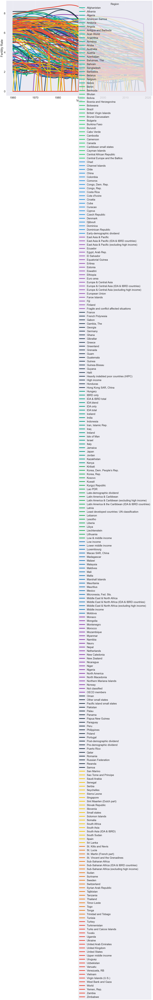

In [128]:
mycolors = ['#1abc9c', '#2ecc71', '#3498db', '#9b59b6', '#34495e', '#16a085', '#27ae60', '#2980b9', '#8e44ad', '#2c3e50', '#f1c40f', '#e67e22', '#e74c3c'] 
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())
# Set the size of the figure and get a figure and axis object
fig, ax = plt.subplots(figsize=(30,20))
# Plot using the axis ax and colormap my_cmap
wb_fert2.loc[1960:].plot(ax=ax, linewidth=8, cmap=my_cmap)
# Change options of axes, legend
ax.tick_params(axis = 'both', which = 'major', labelsize=32)
ax.tick_params(axis = 'both', which = 'minor', labelsize=16)
#ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:, .0f}'))
ax.legend(prop={'size': 30}).set_title("Region", prop = {'size':30})
# Label axes
ax.set_xlabel('Year', fontsize=36)
ax.set_ylabel('Fertility Rate', fontsize=36)

In [129]:
wb_mort = pd.read_excel(pathout + 'WB_mort.xls', sheet_name="Data", skiprows=3)
wb_mort

,Country Name,Region,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,Latin America & Caribbean,ABW,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,6.388,6.241,6.118,6.012,5.920,...,7.918,8.061,8.205,8.347,8.488,8.627,8.765,8.907,9.053,NaN
1,Afghanistan,South Asia,AFG,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,32.219,31.649,31.093,30.551,30.022,...,8.250,7.936,7.645,7.380,7.141,6.929,6.742,6.575,6.423,NaN
2,Angola,Sub-Saharan Africa,AGO,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,27.097,26.859,26.627,26.407,26.194,...,11.680,11.039,10.451,9.921,9.454,9.052,8.716,8.432,8.190,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,South Africa,Sub-Saharan Africa,ZAF,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,17.398,17.104,16.816,16.527,16.233,...,12.085,11.483,10.918,10.430,10.044,9.769,9.599,9.498,9.435,NaN
262,Zambia,Sub-Saharan Africa,ZMB,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,18.471,18.191,17.931,17.689,17.462,...,10.051,9.304,8.637,8.055,7.565,7.169,6.864,6.633,6.456,NaN
263,Zimbabwe,NaN,ZWE,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,14.441,14.104,13.762,13.419,13.083,...,13.679,12.384,11.167,10.115,9.277,8.673,8.286,8.044,7.883,NaN


In [130]:
wb_mort.columns = ['Country Name'] + ['mort_'+str(col) for col in wb_mort.columns[1:]]
wb_mort

,Country Name,mort_Region,mort_Country Code,mort_Indicator Name,mort_Indicator Code,mort_1960,mort_1961,mort_1962,mort_1963,mort_1964,...,mort_2010,mort_2011,mort_2012,mort_2013,mort_2014,mort_2015,mort_2016,mort_2017,mort_2018,mort_2019
0,Aruba,Latin America & Caribbean,ABW,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,6.388,6.241,6.118,6.012,5.920,...,7.918,8.061,8.205,8.347,8.488,8.627,8.765,8.907,9.053,NaN
1,Afghanistan,South Asia,AFG,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,32.219,31.649,31.093,30.551,30.022,...,8.250,7.936,7.645,7.380,7.141,6.929,6.742,6.575,6.423,NaN
2,Angola,Sub-Saharan Africa,AGO,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,27.097,26.859,26.627,26.407,26.194,...,11.680,11.039,10.451,9.921,9.454,9.052,8.716,8.432,8.190,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,South Africa,Sub-Saharan Africa,ZAF,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,17.398,17.104,16.816,16.527,16.233,...,12.085,11.483,10.918,10.430,10.044,9.769,9.599,9.498,9.435,NaN
262,Zambia,Sub-Saharan Africa,ZMB,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,18.471,18.191,17.931,17.689,17.462,...,10.051,9.304,8.637,8.055,7.565,7.169,6.864,6.633,6.456,NaN
263,Zimbabwe,NaN,ZWE,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,14.441,14.104,13.762,13.419,13.083,...,13.679,12.384,11.167,10.115,9.277,8.673,8.286,8.044,7.883,NaN


In [131]:
wb_mort = pd.wide_to_long(wb_mort, ['mort_'], i='Country Name', j='year').reset_index() # wide ---> long
wb_mort

,Country Name,year,mort_Indicator Name,mort_Country Code,mort_Region,mort_Indicator Code,mort_
0,Aruba,1960,"Death rate, crude (per 1,000 people)",ABW,Latin America & Caribbean,SP.DYN.CDRT.IN,6.388
1,Afghanistan,1960,"Death rate, crude (per 1,000 people)",AFG,South Asia,SP.DYN.CDRT.IN,32.219
2,Angola,1960,"Death rate, crude (per 1,000 people)",AGO,Sub-Saharan Africa,SP.DYN.CDRT.IN,27.097
...,...,...,...,...,...,...,...
15837,South Africa,2019,"Death rate, crude (per 1,000 people)",ZAF,Sub-Saharan Africa,SP.DYN.CDRT.IN,NaN
15838,Zambia,2019,"Death rate, crude (per 1,000 people)",ZMB,Sub-Saharan Africa,SP.DYN.CDRT.IN,NaN
15839,Zimbabwe,2019,"Death rate, crude (per 1,000 people)",ZWE,NaN,SP.DYN.CDRT.IN,NaN


In [132]:
wb_mort2 = wb_mort.pivot_table(index='year',columns='Country Name',values='mort_',aggfunc='sum') #otra forma de reshape
wb_mort2

Country Name,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Arab World,Argentina,Armenia,...,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,World,"Yemen, Rep.",Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1960,32.219,11.326,20.355,0.0,0.0,27.097,9.643,20.165357,8.567,9.646,...,13.599,16.007,9.481,12.045,10.00,0.000,17.714523,36.234,18.471,14.441
1961,31.649,10.719,19.967,0.0,0.0,26.859,9.356,19.681097,8.618,9.249,...,13.323,15.567,9.176,11.660,9.68,0.000,14.999311,36.031,18.191,14.104
1962,31.093,10.175,19.574,0.0,0.0,26.627,9.068,19.205420,8.679,8.837,...,13.015,15.119,8.881,11.273,9.36,0.000,13.952690,35.732,17.931,13.762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,6.575,7.714,4.717,5.1,0.0,8.432,6.316,5.413473,7.616,9.862,...,5.000,5.334,6.814,6.253,7.80,3.469,7.540865,5.978,6.633,8.044
2018,6.423,7.898,4.716,0.0,4.4,8.190,6.366,5.380360,7.609,9.857,...,4.700,5.266,6.982,6.317,8.10,3.461,7.528492,5.983,6.456,7.883
2019,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.00,0.000,0.000000,0.000,0.000,0.000


Text(0, 0.5, 'Mortility Rate')

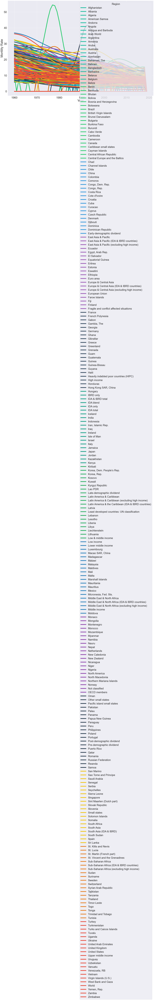

In [133]:
mycolors = ['#1abc9c', '#2ecc71', '#3498db', '#9b59b6', '#34495e', '#16a085', '#27ae60', '#2980b9', '#8e44ad', '#2c3e50', '#f1c40f', '#e67e22', '#e74c3c'] 
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())
# Set the size of the figure and get a figure and axis object
fig, ax = plt.subplots(figsize=(30,20))
# Plot using the axis ax and colormap my_cmap
wb_mort2.loc[1960:].plot(ax=ax, linewidth=8, cmap=my_cmap)
# Change options of axes, legend
ax.tick_params(axis = 'both', which = 'major', labelsize=32)
ax.tick_params(axis = 'both', which = 'minor', labelsize=16)
#ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:, .0f}'))
ax.legend(prop={'size': 30}).set_title("Region", prop = {'size':30})
# Label axes
ax.set_xlabel('Year', fontsize=36)
ax.set_ylabel('Mortility Rate', fontsize=36)

In [134]:
wb_le = pd.read_excel(pathout + 'WB_le.xls', sheet_name="Data", skiprows=3)
wb_le

,Country Name,Region,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,Latin America & Caribbean,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.662,66.074,66.444,66.787,67.113,...,75.017,75.158,75.299,75.441,75.583,75.725,75.868,76.010,76.152,NaN
1,Afghanistan,South Asia,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.446,32.962,33.471,33.971,34.463,...,61.028,61.553,62.054,62.525,62.966,63.377,63.763,64.130,64.486,NaN
2,Angola,Sub-Saharan Africa,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,37.524,37.811,38.113,38.430,38.760,...,55.350,56.330,57.236,58.054,58.776,59.398,59.925,60.379,60.782,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,South Africa,Sub-Saharan Africa,ZAF,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,48.406,48.777,49.142,49.509,49.888,...,57.669,58.895,60.060,61.099,61.968,62.649,63.153,63.538,63.857,NaN
262,Zambia,Sub-Saharan Africa,ZMB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,46.687,47.084,47.446,47.772,48.068,...,55.655,57.126,58.502,59.746,60.831,61.737,62.464,63.043,63.510,NaN
263,Zimbabwe,NaN,ZWE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,53.019,53.483,53.946,54.403,54.849,...,50.640,52.896,55.032,56.897,58.410,59.534,60.294,60.812,61.195,NaN


In [135]:
wb_le.columns = ['Country Name'] + ['le_'+str(col) for col in wb_le.columns[1:]]
wb_le

,Country Name,le_Region,le_Country Code,le_Indicator Name,le_Indicator Code,le_1960,le_1961,le_1962,le_1963,le_1964,...,le_2010,le_2011,le_2012,le_2013,le_2014,le_2015,le_2016,le_2017,le_2018,le_2019
0,Aruba,Latin America & Caribbean,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.662,66.074,66.444,66.787,67.113,...,75.017,75.158,75.299,75.441,75.583,75.725,75.868,76.010,76.152,NaN
1,Afghanistan,South Asia,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.446,32.962,33.471,33.971,34.463,...,61.028,61.553,62.054,62.525,62.966,63.377,63.763,64.130,64.486,NaN
2,Angola,Sub-Saharan Africa,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,37.524,37.811,38.113,38.430,38.760,...,55.350,56.330,57.236,58.054,58.776,59.398,59.925,60.379,60.782,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,South Africa,Sub-Saharan Africa,ZAF,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,48.406,48.777,49.142,49.509,49.888,...,57.669,58.895,60.060,61.099,61.968,62.649,63.153,63.538,63.857,NaN
262,Zambia,Sub-Saharan Africa,ZMB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,46.687,47.084,47.446,47.772,48.068,...,55.655,57.126,58.502,59.746,60.831,61.737,62.464,63.043,63.510,NaN
263,Zimbabwe,NaN,ZWE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,53.019,53.483,53.946,54.403,54.849,...,50.640,52.896,55.032,56.897,58.410,59.534,60.294,60.812,61.195,NaN


In [136]:
wb_le = pd.wide_to_long(wb_le, ['le_'], i='Country Name', j='year').reset_index() # wide ---> long
wb_le

,Country Name,year,le_Indicator Name,le_Region,le_Indicator Code,le_Country Code,le_
0,Aruba,1960,"Life expectancy at birth, total (years)",Latin America & Caribbean,SP.DYN.LE00.IN,ABW,65.662
1,Afghanistan,1960,"Life expectancy at birth, total (years)",South Asia,SP.DYN.LE00.IN,AFG,32.446
2,Angola,1960,"Life expectancy at birth, total (years)",Sub-Saharan Africa,SP.DYN.LE00.IN,AGO,37.524
...,...,...,...,...,...,...,...
15837,South Africa,2019,"Life expectancy at birth, total (years)",Sub-Saharan Africa,SP.DYN.LE00.IN,ZAF,NaN
15838,Zambia,2019,"Life expectancy at birth, total (years)",Sub-Saharan Africa,SP.DYN.LE00.IN,ZMB,NaN
15839,Zimbabwe,2019,"Life expectancy at birth, total (years)",NaN,SP.DYN.LE00.IN,ZWE,NaN


In [137]:
wb_le2 = wb_le.pivot_table(index='year',columns='Country Name',values='le_',aggfunc='sum') #otra forma de reshape
wb_le2

Country Name,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Arab World,Argentina,Armenia,...,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,World,"Yemen, Rep.",Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1960,32.446,62.283,46.141,0.0,0.0,37.524,61.968,46.546909,65.055,65.972,...,58.835,48.975,59.831,59.039,66.224854,0.000,52.578207,29.919,46.687,53.019
1961,32.962,63.301,46.599,0.0,0.0,37.811,62.523,47.141621,65.176,66.403,...,59.210,49.498,60.377,59.720,66.487976,0.000,53.079382,30.163,47.084,53.483
1962,33.471,64.190,47.056,0.0,0.0,38.113,63.049,47.731783,65.269,66.838,...,59.589,50.031,60.907,60.387,66.741098,0.000,53.496641,30.500,47.446,53.946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,64.130,78.333,76.499,0.0,0.0,60.379,76.752,71.622526,76.372,74.797,...,71.388,70.172,72.246,75.241,79.419512,73.740,72.385296,66.086,63.043,60.812
2018,64.486,78.458,76.693,0.0,0.0,60.782,76.885,71.806825,76.520,74.945,...,71.573,70.323,72.128,75.317,79.568293,73.895,72.560056,66.096,63.510,61.195
2019,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000000,0.000,0.000000,0.000,0.000,0.000


Text(0, 0.5, 'Life Expentancy')

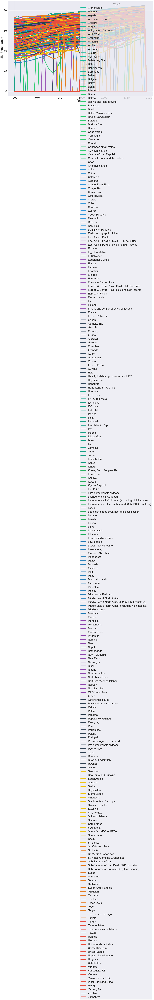

In [138]:
mycolors = ['#1abc9c', '#2ecc71', '#3498db', '#9b59b6', '#34495e', '#16a085', '#27ae60', '#2980b9', '#8e44ad', '#2c3e50', '#f1c40f', '#e67e22', '#e74c3c'] 
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())
# Set the size of the figure and get a figure and axis object
fig, ax = plt.subplots(figsize=(30,20))
# Plot using the axis ax and colormap my_cmap
wb_le2.loc[1960:].plot(ax=ax, linewidth=8, cmap=my_cmap)
# Change options of axes, legend
ax.tick_params(axis = 'both', which = 'major', labelsize=32)
ax.tick_params(axis = 'both', which = 'minor', labelsize=16)
#ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:, .0f}'))
ax.legend(prop={'size': 30}).set_title("Region", prop = {'size':30})
# Label axes
ax.set_xlabel('Year', fontsize=36)
ax.set_ylabel('Life Expentancy', fontsize=36)

### Solution 4

In [144]:
hdm_le = pd.read_table('//Users/anramive/Documents/GitHub/assignment-3-aneramirezve1452/E0per.txt', 
                       delim_whitespace=True, names=('Year', 'Male', 'Female','Total'))
